# Guideline for the use of climatewatches python library
By Andriamihaja R. 

## I- Description of the library

**climatewatches** is a Python toolkit for climate bulletin monitoring and visualization. It includes: 
- station monitoring plots,
- climatology maps (rainfall and temperature maps) from netcdf data,
- tropical cyclone monitoring dataset,
- and large-scale climate driver diagnostics.

On each plot function, user can chooe language by using the parameter 'language' on the plot between : 
- 'fr': french, which is by default language
- 'mg': malagasy
- 'en': english. 

## II- Installation

To install it, use : 
`pip install climatewatches`

## III- Use of climatewatches

To use the library, it can be imported by using import function.

In [40]:
import climatewatches
help(climatewatches)

Help on package climatewatches:

NAME
    climatewatches - ClimateWatches is a Python toolkit for climate bulletin monitoring and visualization.

PACKAGE CONTENTS
    annual_analysis
    climatology
    disaster_analysis
    disaster_crop_plot
    interannual_variability
    monitor_tc
    monitoring_climate_driver
    monitoring_large_scale_param
    monitoring_stn
    plot_disaster_impact
    preparation_data
    spatial_map

FUNCTIONS
    __getattr__(name)

DATA
    __all__ = ['annual_trend', 'assign_season_year', 'blend_stn_cdt_data',...

VERSION
    1.0.1

FILE
    /run/media/dihj/DATA/Bulletin/Bulletin_processing/bulvenv/lib/python3.13/site-packages/climatewatches/__init__.py




### III-1: Example of the use of climatewatches

#### **Data preparation for station dataset**
Station data should be in csv format with column names : [Date, Tmin, Tmax, Rainfall, Tmean]): 
```
Date,Tmin,Tmax,Tmean,Rainfall
19910101,24.689,34.255,29.472,0.000
19910102,24.828,34.304,29.566,0.000
19910103,25.136,34.419,29.777,7.561
19910104,25.563,33.682,29.623,0.000
......
```
Data from CDT for the temperature min and max can be merged with Rainfall. 
The function **climatewatches.preparation_data** can be used here. 

In [3]:
import climatewatches.preparation_data as prep
rr = "./data/RR_ambatobeony_stn_old.csv"
tmin = "./data/TMIN_ambatobeony_stn_old.csv"
tmax = "./data/TMAX_ambatobeony_stn_old.csv"
prep.blend_stn_cdt_data(
    rain_file = rr, 
    tmin_file = tmin, 
    tmax_file = tmax, 
    output_file = "./data/AmbatoBoeny_data.csv"
)


Merged file saved as: ./data/AmbatoBoeny_data.csv


,Date,Tmin,Tmax,Tmean,Rainfall
0,1991-01-01,24.689,34.255,29.4720,0.000
1,1991-01-02,24.828,34.304,29.5660,0.000
2,1991-01-03,25.136,34.419,29.7775,7.561
3,1991-01-04,25.563,33.682,29.6225,0.000
4,1991-01-05,24.840,32.357,28.5985,36.908
...,...,...,...,...,...
10953,2020-12-27,24.323,30.326,27.3245,23.441
10954,2020-12-28,25.291,29.942,27.6165,35.579
10955,2020-12-29,24.389,NaN,NaN,11.959
10956,2020-12-30,23.927,33.550,28.7385,1.760


#### **Plotting station data graph**


The function **interannual_variability** could be use to plot graph for interannual variability plot, so comparing each season, or each month based on the selected reference dataset. By default, the climatological period used here is the latest climatological period 1991-2020. 
Anomaly and cumulated value of rainfall are shown in the plot graph. 
Available function are: 
- plot_precip_interannual_variability
- plot_temperature_interannual_variability


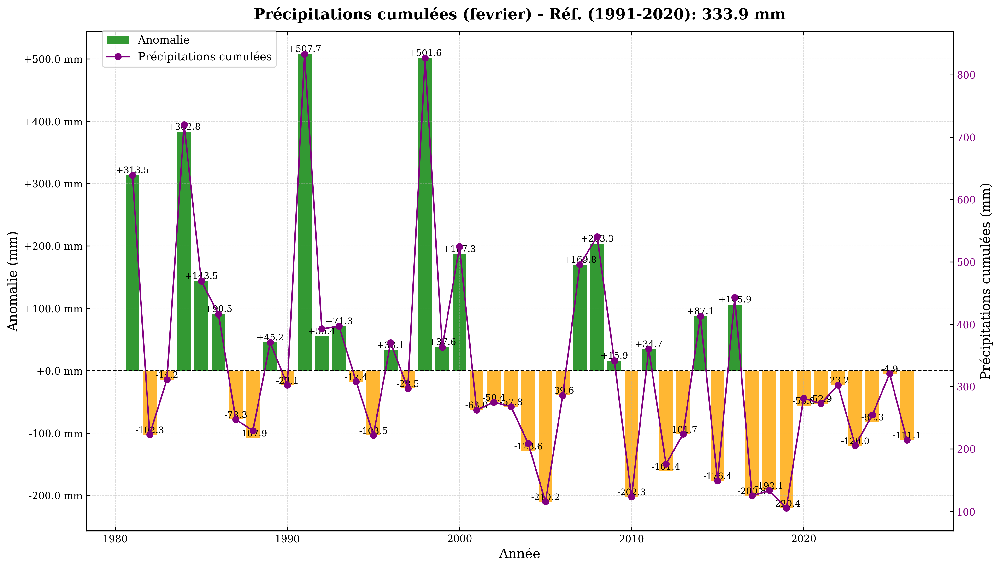

Graphique créé et enregistré: Interannual_variability_precip_month_fevrier_fr.png


In [48]:
import climatewatches.interannual_variability as cv
stn = "./data/DATA_MAHAJANGA_AERO_81-25.csv"

# For rainfall graph
cv.plot_precip_interannual_variability(
    file = stn, 
    analysis='month', 
    timescale='fevrier', #timescale should be in french without extra words: janvier, mars, aout, ...
    language='fr'
)


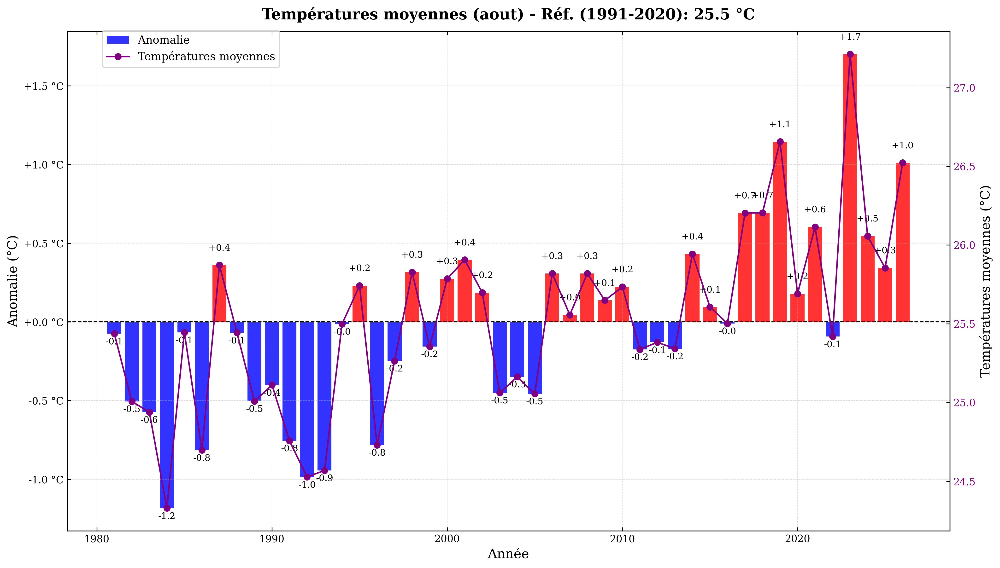

Graphique créé et enregistré: Interannual_variability_temperature_month_aout_fr.png


In [6]:
# For temperature graph

cv.plot_temp_interannual_variability(
    file = stn, 
    analysis='month', 
    timescale='aout', 
    language='fr'
)

--------------------------------------------------------------------------------------------------------------------
The module **monitoring_stn** plot monthly graph by using
- **plot_stn_monthly_monitoring** : graph to combine in a same plot the rainfall, temperature min and max daily values and comparing them with the climatology range
- **plot_interannual_variability** : graph used to monitor and compare monthly accumulated rainfall for each year with the z-score
- **plot_stn_precip_monitoring** : graph to monitor rainfall daily dataset with its accumulated values during a season year, and alongside the climatology range. User can choose when a season of a year start.
- **plot_stn_temp_monitoring** : graph to monitor temperature min and max daily during a season year alongside the climatology range.


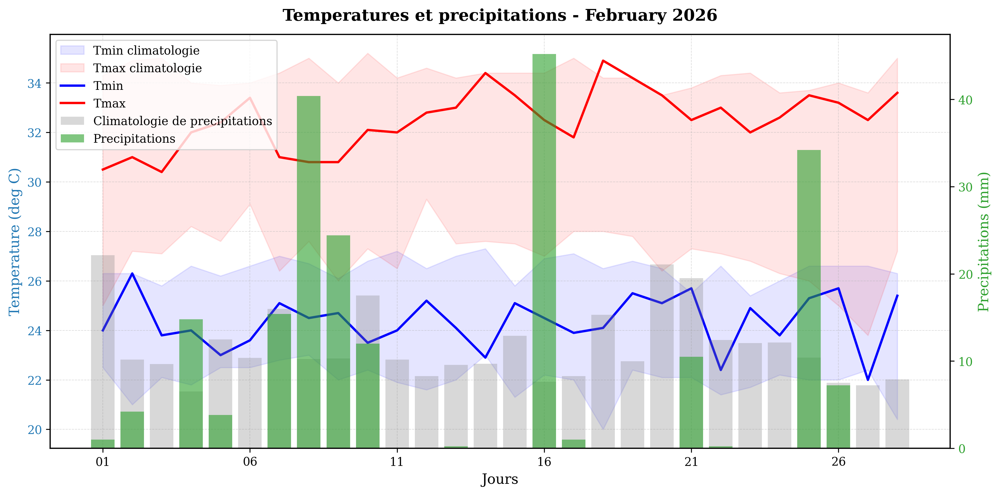

Graphique cree et enregistre: Monthly_Temperature_Rainfall_02_2026_fr.png


In [49]:
import climatewatches.monitoring_stn as mon

rr = "./data/DATA_MAHAJANGA_AERO_81-25.csv"
mon.plot_stn_monthly_monitoring(
    file = rr, 
    selected_month = 2, 
    selected_year = 2026
)


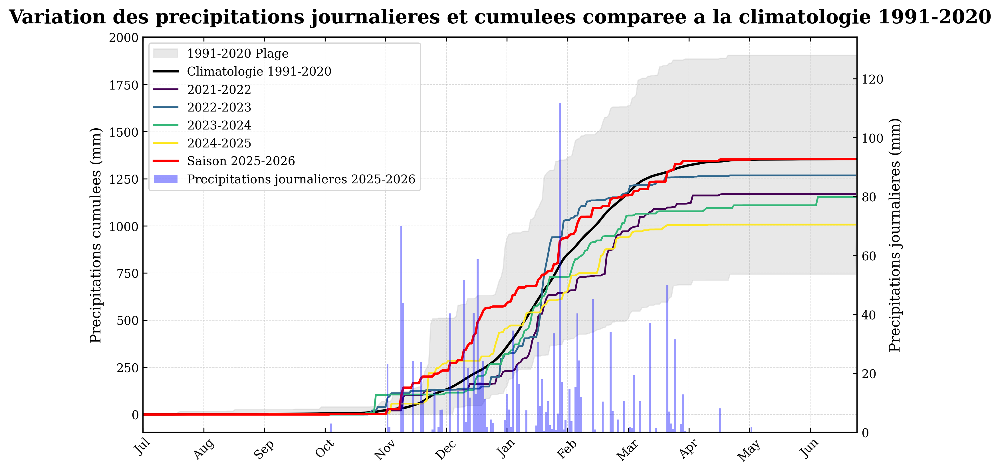

Graphique cree et enregistre: Seasonal_Rainfall_Cumulative_And_Daily_2025-2026_fr.png


In [52]:

stn = "./data/DATA_MAHAJANGA_AERO_81-25.csv"
mon.plot_stn_precip_monitoring(
    stn, 
    season_start_month=7,
    season_year = 2025
)


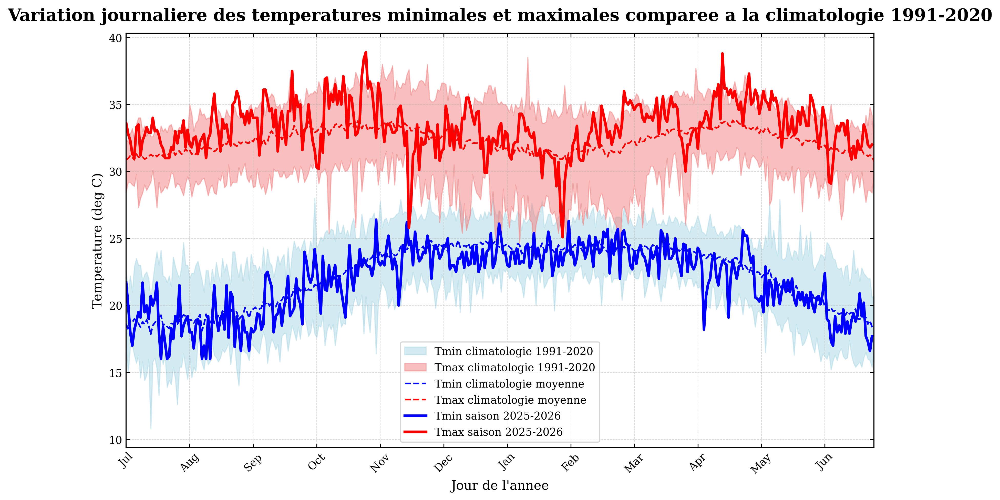

Graphique cree et enregistre: Seasonal_Temperature_Mean_Tmin_Tmax_2025-2026_fr.png


In [53]:
#climatewatches.monitoring_stn.plot_stn_temp_monitoring(stn, season_start_month=8)
mon.plot_stn_temp_monitoring(
    stn, 
    season_start_month = 7, 
    season_year = 2025
)


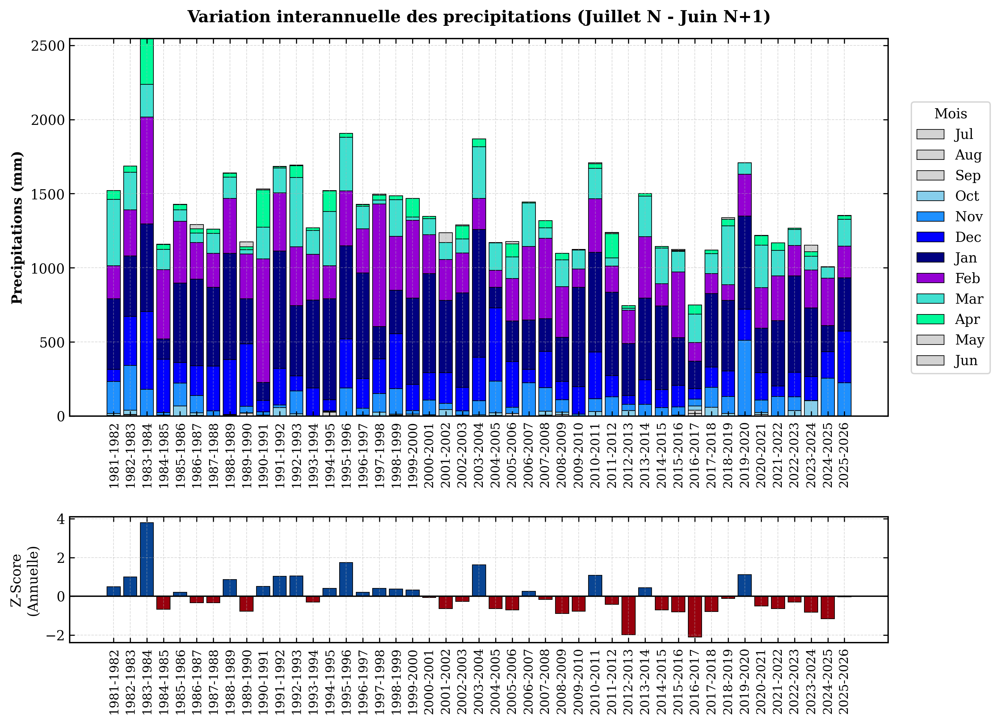

Graphique cree et enregistre: Variation_interannual_Rainfall_ONDJFMA_fr.png


In [54]:
# For interannual monthly variability
mon.plot_monthly_interannual_variability(stn)


#### **Spatial map**
The spatial map module are used for plotting spatial map for rainfall and temperature. 
Monthly data output from CDT from the combined netcdf files to one on CDT can be used here.
The delimitation plot depends on the shapefile delimitation use but not the data itself. 

Function for the module **spatial_map** are: 
- **plot_precip_map**: spatial map for a specific month. 
- **plot_precip_anomaly**: spatial map anomaly for a specific month. 
- **plot_temp_map**: idem as for precipitation
- **plot_temp_anomaly**: idem as for precipitation


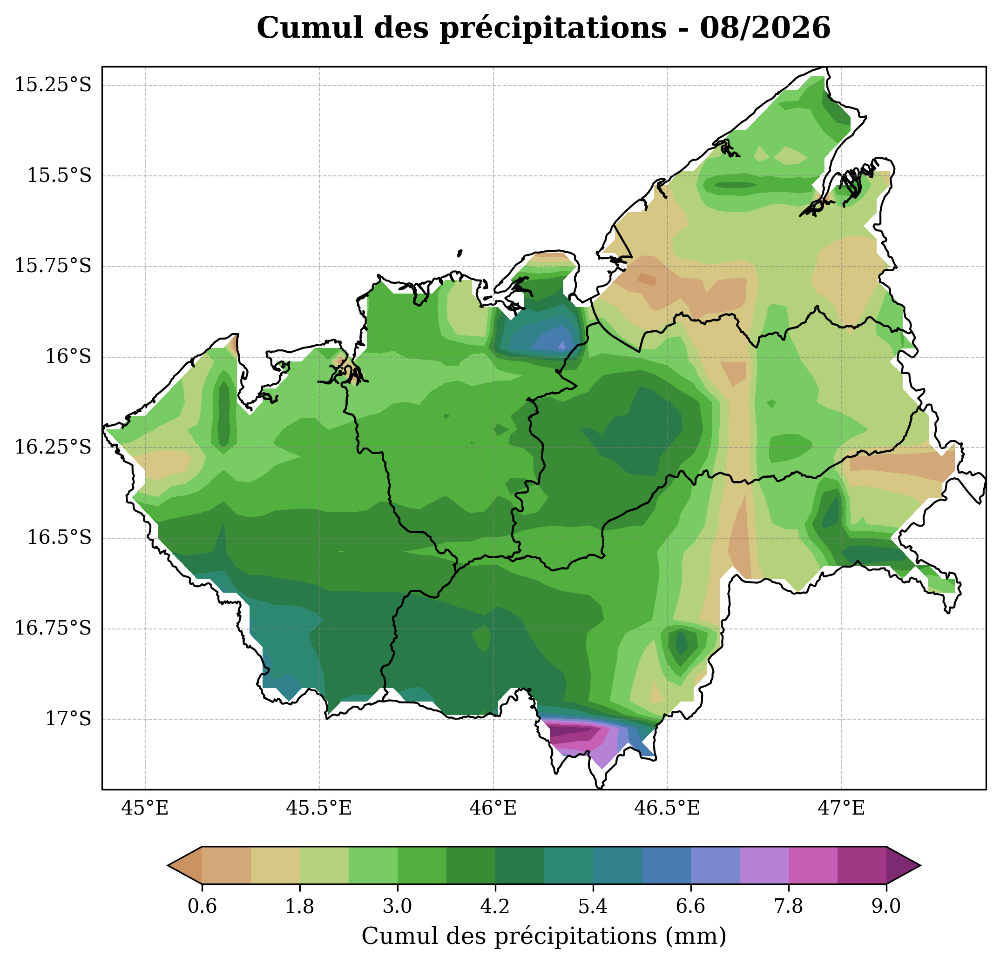

Carte créée et enregistrée: Rainfall_sum_month_08_2026.png


In [14]:

import climatewatches.spatial_map as cs

rr = "./data/RR_MONTHLY_199101_202608.nc"
shp = "./data/shp/Boeny-district_new2025.shp"
cs.plot_precip_map(file = rr, 
                   shapefile = shp, 
                   analysis='month', 
                   timescale=8, 
                   year=2026
                  )


/run/media/dihj/DATA/Bulletin/Bulletin_processing/bulvenv/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


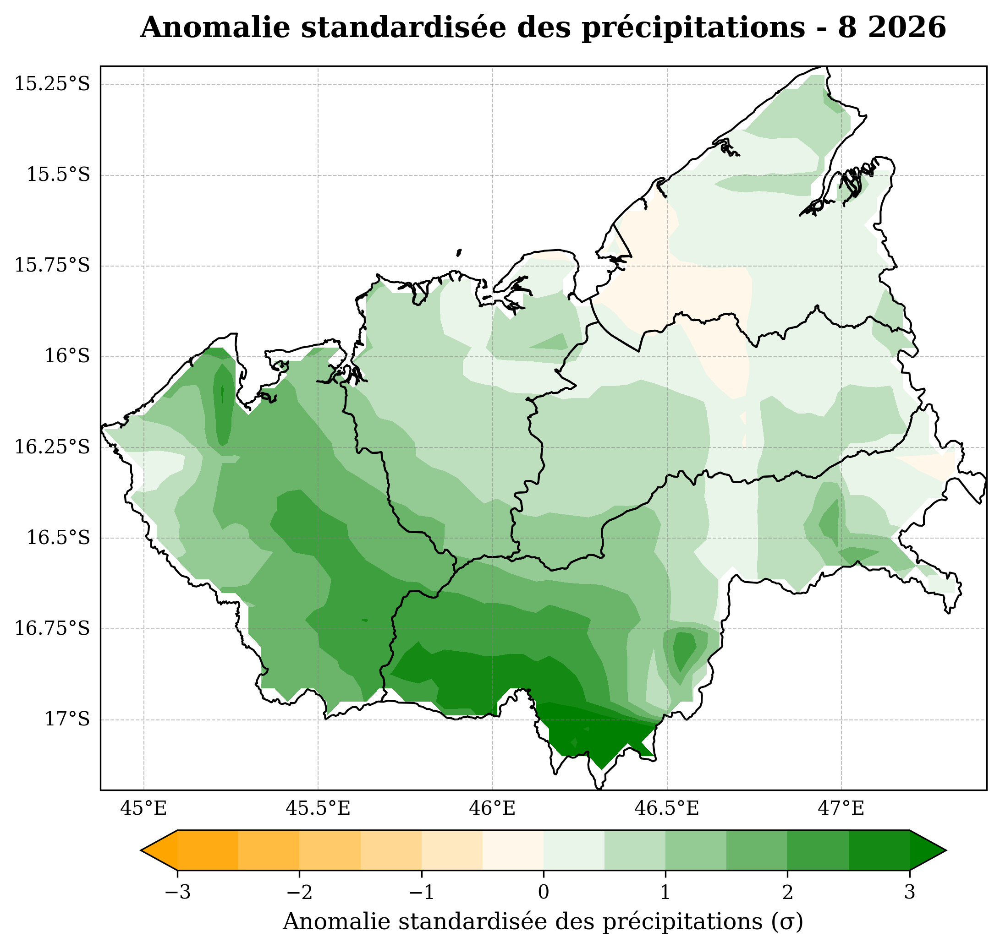

Carte créée et enregistrée: Rainfall_Anomaly_season_8_2026.png


In [15]:
# For rainfall anomaly
cs.plot_precip_anomaly(
    file = rr, 
    shapefile = shp, 
    analysis='month', 
    timescale=8, 
    year=2026
)


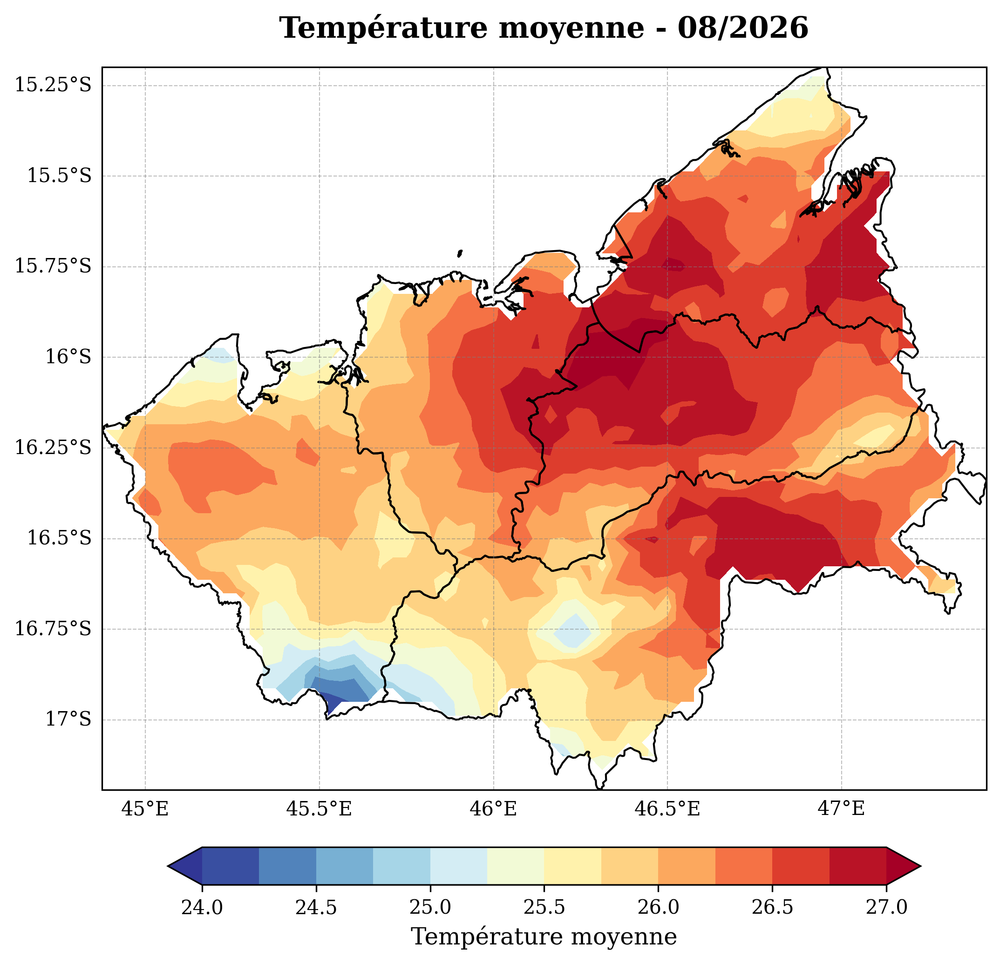

Carte créée et enregistrée: Temperature_mean_month_08_2026.png


In [16]:
# For temperature data

tm = "./data/TMEAN_MONTHLY_199101_202608.nc"
cs.plot_temp_map(
    tm, 
    shp, 
    analysis='month', 
    timescale=8, 
    year=2026
)


/run/media/dihj/DATA/Bulletin/Bulletin_processing/bulvenv/lib/python3.13/site-packages/numpy/lib/_nanfunctions_impl.py:1997: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


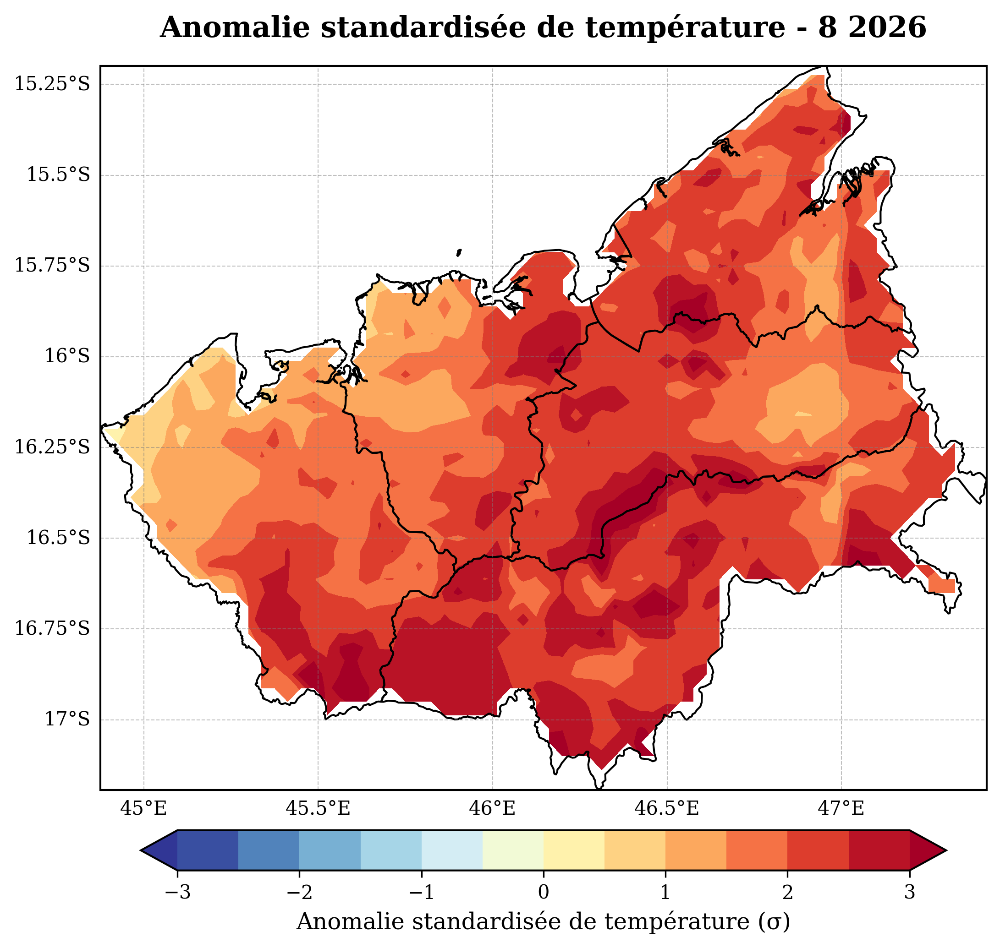

Carte créée et enregistrée: Temperature_anomaly_month_8_2026.png


In [55]:
# For temperature anomaly

cs.plot_temp_anomaly(
    tm, 
    shp, 
    analysis='month', 
    timescale=8, 
    year=2026
)


#### **Tropical cyclone monitoring **
The tropical cyclone monitoring module is to plot track on tropical cyclone based on the DGM Madagascar color code classification. 
The tropical cyclone data must be in csv format and have this format :

,Date,LAT,LON,Unnamed: 3,Pression,Vent max kt,Vent max km/h,Rafale kt,Rafale km/h,Categorie,NAME
0,19/01/2026 1200,-25.27,35.37,NaN,1006,30,56,40,74,Zone Perturbe,EWETSE
1,19/01/2026 1800,-25.03,36.27,1.0,1005,30,56,40,74,Zone perturbe Isobare ferme,EWETSE
2,20/01/2026 0000,-24.16,36.65,1.0,1004,30,56,40,74,Zone perturbe Isobare ferme,EWETSE
3,20/01/2026 0600,-24.89,38.17,1.5,1000,35,65,50,93,24,EWETSE
4,20/01/2026 1200,-24.83,39.90,2.0,997,45,83,65,120,24,EWETSE


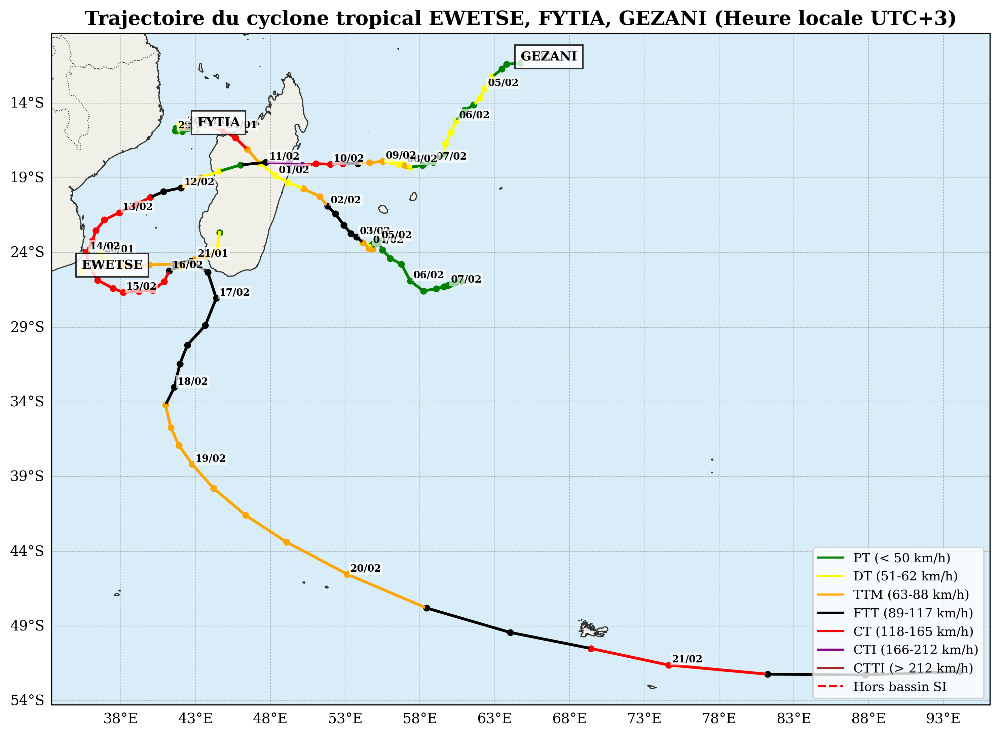

Graphique cree et enregistre: EWETSE_FYTIA_GEZANI_track.png


In [20]:
import climatewatches.monitor_tc as tc
data = "./data/TC_track_2025_2026.csv"

#tc.plot_track_tc(data, start_date="01-10-2025", end_date="30-04-2026")
tc.plot_track_tc(
    data, 
    start_date="01-10-2025", 
    end_date="30-04-2026", 
    #cyclone_names="FYTIA",
)


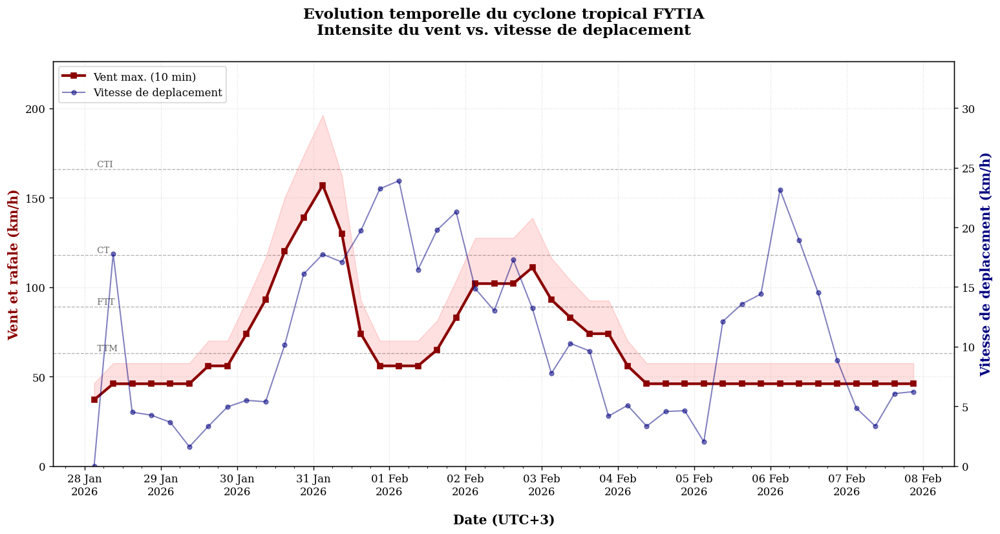

Graphique cree et enregistre: Cyclone_Evolution_FYTIA.pdf


In [21]:
# For temporal evolution od a specific Tropical cyclone. 
tc.temporal_evolution_tc(
    data, 
    start_date="01-10-2025", 
    end_date="30-04-2026", 
    cyclone_name="FYTIA"
)


-------------------------------------------------------------------------------------------------------------------
#### **Climatology module**
On the **climaotlogy** module, this is for spatial analysis. 
Available function are: 
- **plot_climaotology_spatial_mean**: which extract data from a netcdf file basedo on a shapefile delimitation and plot the interannual variability barplot alongside the range of tercile inf (33%), sup (66%), those are the threshold related to the seasonal forecast range.
- **plot_composite_map**: plot simple spatial composite map of selected years and season
- **plot_diagram_ombro_one_point**: which plot a ombrothermic diagram for a selected coordinate point or for a shapefile delimitation.
- **plot_precip_climatology_map**: to plot spatial climatology map for a selected season
- **plot_temperature_climaotlogy_map**: to plot spatial climatlogy map for a selected season

.

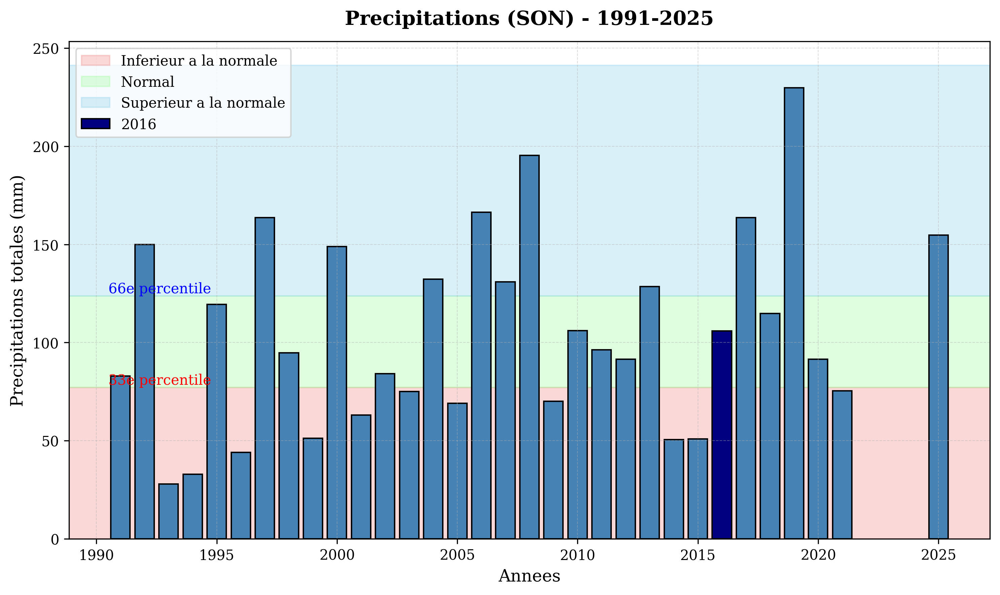

Graphique cree et enregistre: Rainfall_bar_season_SON_fr.png


In [25]:
import climatewatches.climatology as clim

rr = "./data/RR_MONTHLY_199101_202608.nc"
shp = "./data/shp/Boeny-district_new2025.shp"
clim.plot_climatology_spatial_mean(
    file = rr, 
    shapefile = shp, 
    analysis = "season", 
    timescale = "SON",
    selected_year = 2016, 
)


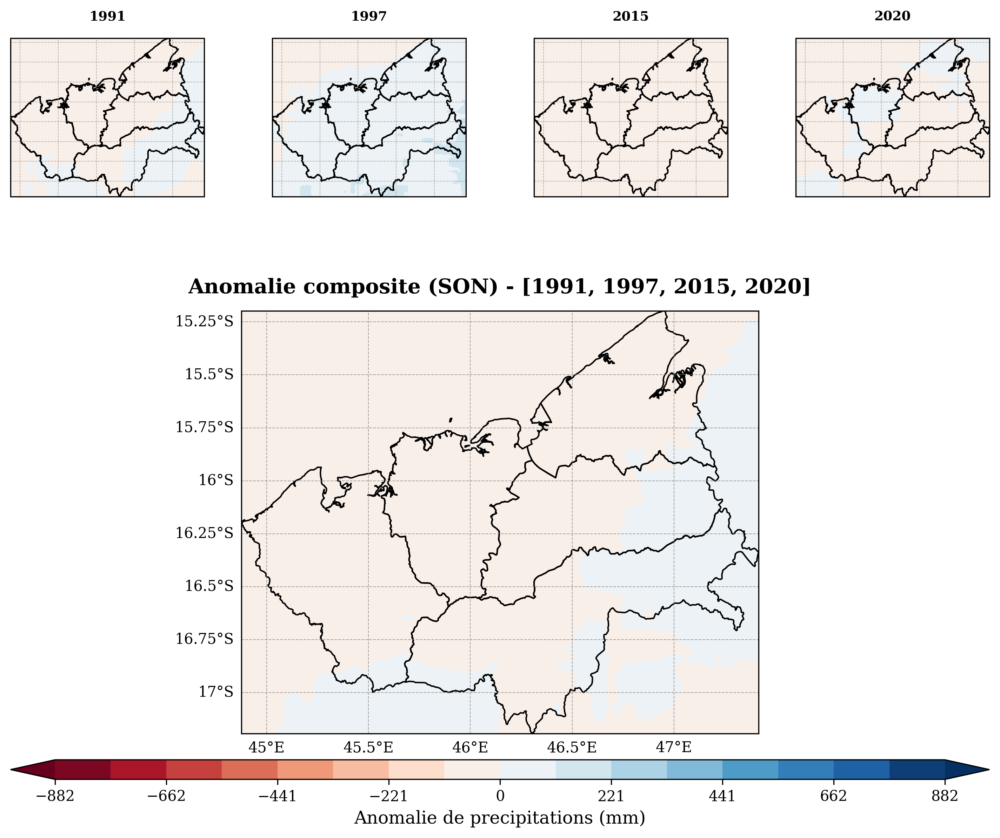

Graphique cree et enregistre: composite_map_rfe_SON_1991_1997_2015_2020_fr.png


In [26]:
# For composite map

rr = "./data/RR_MONTHLY_199101_202608.nc"
shp = "./data/shp/Boeny-district_new2025.shp"
clim.plot_composite_map(
    file = rr, 
    shapefile = shp, 
    analysis = "season", 
    timescale = "SON",
    selected_years = (1991, 1997, 2015, 2020) 
)


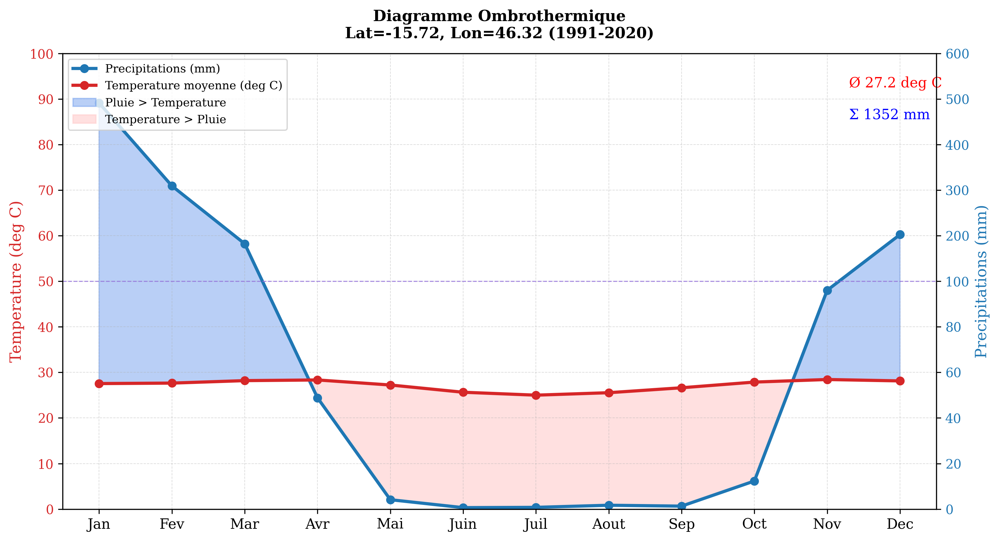

Graphique cree et enregistre: Diagram_ombro_lat-15.72_lon46.32_fr.png


In [27]:
# For ombrothermic diagram

rr = "./data/RR_MONTHLY_199101_202608.nc"
tmean = "./data/TMEAN_MONTHLY_199101_202608.nc"
lat = -15.72
lon = 46.32

clim.plot_diagram_ombro_one_point(
    rain_file = rr,
    temp_file = tmean,
    latitude = lat, 
    longitude = lon
)


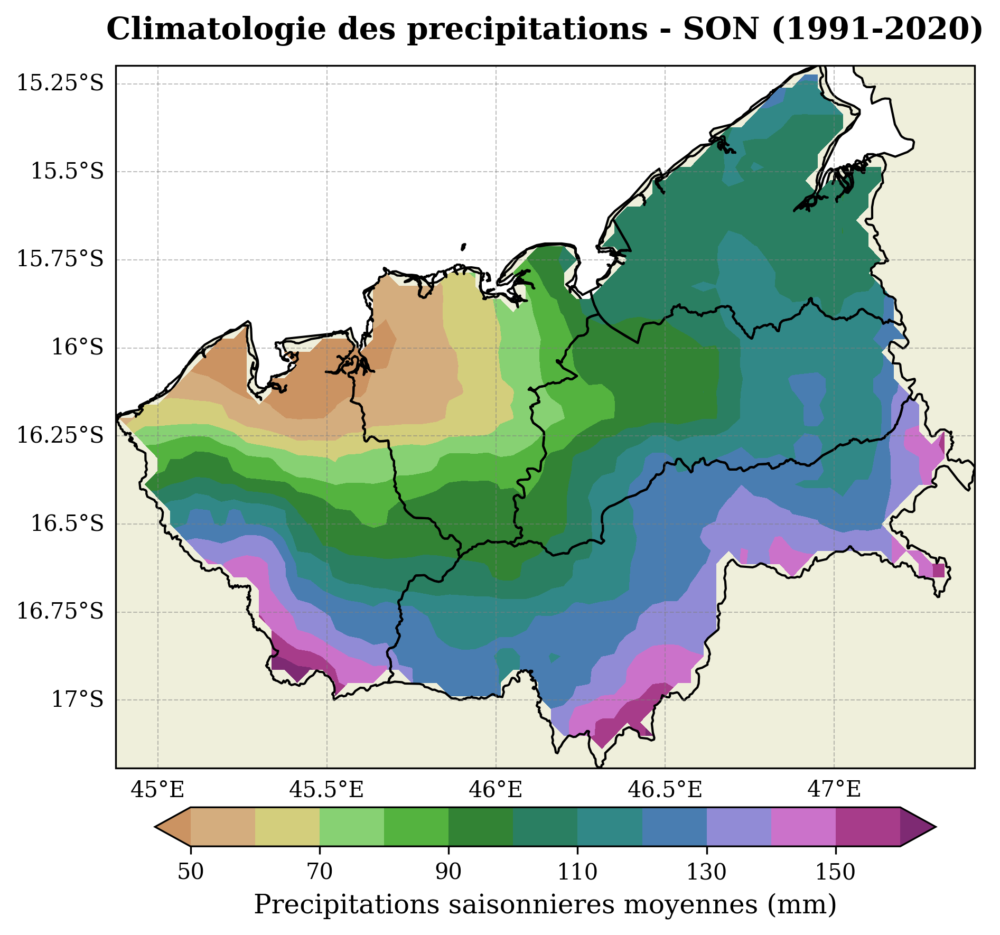

Graphique cree et enregistre: Rainfall_Climatology_SEASON_SON_fr.png


In [28]:
# For rainfall climatology

rr = "./data/RR_MONTHLY_199101_202608.nc"
shp = "./data/shp/Boeny-district_new2025.shp"

clim.plot_precip_climatology_map(
    file = rr, 
    shapefile = shp, 
    analysis = "season", 
    timescale = "SON"
)


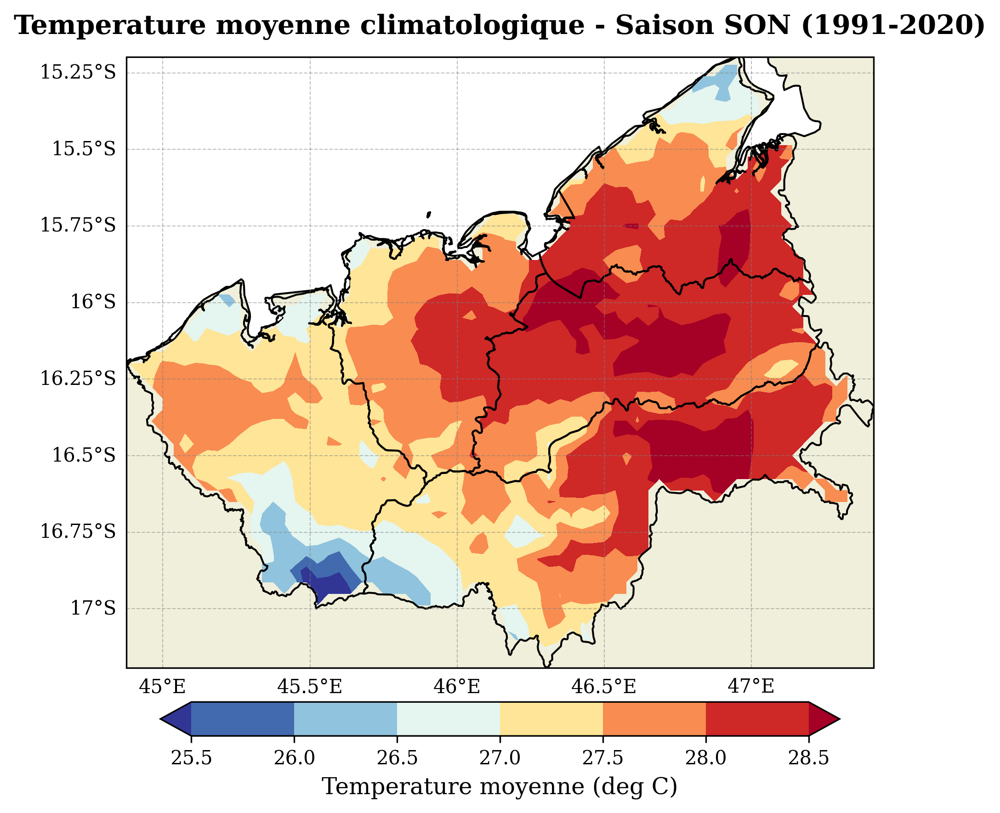

Graphique cree et enregistre: Temperature_Climatology_SEASON_SON_fr.png


In [29]:
# For temperature climatology

tmean = "./data/TMEAN_MONTHLY_199101_202608.nc"
shp = "./data/shp/Boeny-district_new2025.shp"

clim.plot_temperature_climatology_map(
    file = tmean, 
    shapefile = shp, 
    analysis = "season", 
    timescale = "SON"
)


------------------------------------------------------------------------------------------------------------------
#### **Climate driver**
The module for **climate driver** plot is used for monitoring cliamte driver parameter especially ENSO, IOD, SIOD, ONI ... 
Function are: 
- **plot_climate_indices**: which plot climate drivers indices in on graph. User can choose what indices to put on the graph
- **plot_sst_map_variability**: is a function to plot the spatial map of the SST over a region. Monthly or seasonal values with the related anomaly map.

.

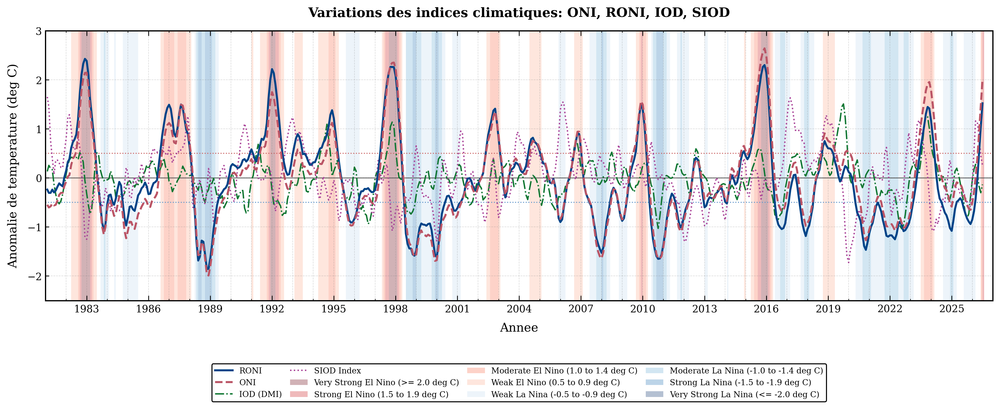

Graphique cree et enregistre: ocean_indices_teleconnection_plot.png


In [62]:
import climatewatches.monitoring_climate_driver as cmon
# Download latest sst data here: https://psl.noaa.gov/data/gridded/data.noaa.ersst.v5.html
sst = "./data/sst.mnmean.nc"
cmon.plot_climate_indices(
    sst, 
    data_start = "1981-01-01", 
    data_end = "2026-08-31",
    soi_file = None, # this could be downloaded on a SOI montoring dataset on JAMSTEC
    include_soi = False, 
    include_roni = True
)


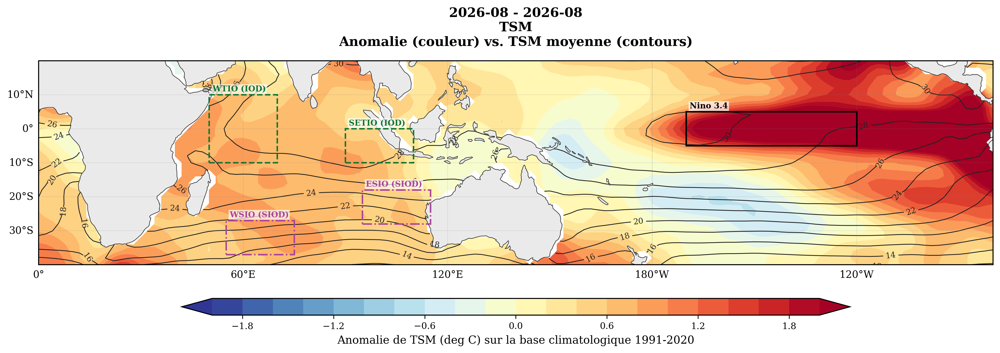

Graphique cree et enregistre: sst_anomaly_contours_with_boxes_2026-08_2026-08_fr.png


In [37]:
# To plot spatial map anomaly with values. 
cmon.plot_sst_map_variability(
    sst_file = sst, 
    target_start = "2026-08-01",
    target_end = "2026-08-31", 
    months_of_interest = 8,
    domain_extent=[0, 280, 20, -40] #lonW, lonE, latN, latS
)


Other function are available in this python library climatewatches but user can see all of them by using the help function. 
Good luck!
:) 